## Worldwide Analysis of Happiness Levels in the past 10 years

Proposal: Worldwide Happiness Throughout the World 

Data source: https://worldhappiness.report/ed/2021/



https://www.theglobaleconomy.com/USA/happiness/

Explanation of the data source:   https://worldhappiness.report/ed/2021/#appendices-and-data

Background: Since 2007 happiness inequality has risen within countries, meaning that the gap between the unhappy and the happy has widened.  The negative emotions have risen much more around the world, and the United States was struggling with this situation for years.  Despite the ongoing pandemic, the world is as happy in 2021 as it was the year before. Also, the United States’ happiness level increased despite the pandemic. To analyze the countries, the World Happiness Report survey ranks global happiness in countries around the world annually and tracks six factors to measure happiness among the world’s citizens: life expectancy, economics, social support, absence of corruption, freedom, and generosity. It focuses on the effects of COVID-19 and how people all over the world have fared in 2021. For this project, questions:

1.	Which country is the happiest? Which continent? Which factor appears to have the greatest (or smallest) impact on a nation’s happiness? Where is the US ranked? Where is China ranked?
2.	 Could I use a colorful global level of happiness map to show where people are very happy versus where they are not happy at all? If so, what would the color of the U.S. be?
3.	 What is the level of happiness highly correlated around the world?
4.	Look into the relationship between the economy and happiness.
5.	Investigate the effects of government type on happiness.


In [1]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
import geopandas as gpd

In [4]:
import geoviews as gv

/Users/esinyilmaz/opt/anaconda3/lib/python3.9/site-packages/geoviews/operation/__init__.py:14: HoloviewsDeprecationWarning: 'ResamplingOperation' is deprecated and will be removed in version 1.18, use 'ResampleOperation2D' instead.
  from holoviews.operation.datashader import (


In [5]:
import geoviews.feature as gf

In [6]:
import cartopy
import cartopy.feature as cf
from cartopy import crs as ccrs

In [7]:
import holoviews as hv
hv.extension("matplotlib")
hv.extension("bokeh")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [8]:
###import libraries

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import geopandas as gpd
#import geoviews as gv
#import geoviews.feature as gf

import cartopy
import cartopy.feature as cf
from cartopy import crs as ccrs

import holoviews as hv
hv.extension("matplotlib")
hv.extension("bokeh")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [11]:
#sns.set_style('darkgrid')
plt.rcParams['font.size'] = 15

plt.rcParams['figure.figsize'] = (10,7)
#plt.rcParams['figure.facecolor'] = '#FFE584'

#### LOAD ALL RAW DATA:

In [12]:
whd = pd.read_excel('data/happiness_DataPanelWHR2021C2.xlsx')

In [13]:
mortality = pd.read_excel('data/happiness_MortalityDataWHR2021C2.xlsx')

In [14]:
country_locations = pd.read_csv("data/happiness_country_locations.csv")

In [15]:
regions = pd.read_csv('data/happiness_regions.csv')

In [16]:
democracy = pd.read_csv("data/happiness_democracyIndex.csv")

####  MERGE AND CREATE MASTER (BIG DADDY DATAFRAME):

In [17]:
mortality = mortality[['Country name','Median age','Island','Female head of government']]
merge1 = pd.merge(whd,mortality,how="left")

In [18]:
democracy = democracy[["country","category","score"]].rename(columns={'country':'Country name','category':'Government Type','score':'Democracy Index'})
merge2 = pd.merge(merge1,democracy,how="left")

In [19]:
country_locations = country_locations[["country","latitude","longitude"]].rename(columns={'country':'Country name'})
merge3 = pd.merge(merge2,country_locations,how="left")

In [20]:
regions = regions[['Country name',"Regional indicator"]]
merge4 = pd.merge(merge3,regions,how="left")

In [21]:
### Narrow down data to last ten years and create final/master dataframe

final = merge4[(merge4.year>=2010) & (merge4.year<=2020)]
final.to_csv('data/BIG_DADDY_DATA_FRAME_Updated',index=False)

In [22]:
### Calculate average ladder score in each country and add to final dataframe

country_averages = final.groupby(["Country name"],as_index=False)['Life Ladder'].mean().sort_values(by='Life Ladder')
country_averages = country_averages.rename(columns={'Life Ladder':'Avg Ladder'})
final = pd.merge(final,country_averages,how="left")

#### SOME BROAD DATA EXPLORATION:

In [23]:
### Which country is the happiest?
final.sort_values(by=['Life Ladder', 'year'], ascending=False)[:10]

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Median age,Island,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder
438,Finland,2020,7.889350,10.750446,0.961621,72.099998,0.962424,-0.115532,0.163636,0.744292,0.192898,42.799999,0.0,1.0,Full Democracy,9.20,61.924110,25.748151,Western Europe,7.583703
436,Finland,2018,7.858107,10.782932,0.962155,71.900002,0.937807,-0.127380,0.198605,0.781546,0.181781,42.799999,0.0,1.0,Full Democracy,9.20,61.924110,25.748151,Western Europe,7.583703
435,Finland,2017,7.788252,10.768089,0.963826,71.800003,0.962199,-0.002134,0.192413,0.787137,0.176066,42.799999,0.0,1.0,Full Democracy,9.20,61.924110,25.748151,Western Europe,7.583703
353,Denmark,2011,7.788232,10.847698,0.961736,70.620003,0.934760,0.297531,0.220043,0.769436,0.174883,42.299999,0.0,1.0,Full Democracy,9.15,56.263920,9.501785,Western Europe,7.608832
437,Finland,2019,7.780348,10.791813,0.937416,72.000000,0.947617,-0.051525,0.195338,0.755210,0.180733,42.799999,0.0,1.0,Full Democracy,9.20,61.924110,25.748151,Western Europe,7.583703
1281,Switzerland,2012,7.776209,11.079147,0.946864,72.779999,0.945428,0.138619,0.323241,0.859107,0.176007,43.099998,0.0,0.0,Full Democracy,8.83,46.818188,8.227512,Western Europe,7.560563
352,Denmark,2010,7.770515,10.838536,0.974977,70.400002,0.943631,0.242442,0.174896,0.784827,0.154563,42.299999,0.0,1.0,Full Democracy,9.15,56.263920,9.501785,Western Europe,7.608832
1287,Switzerland,2019,7.694221,11.136454,0.948513,74.400002,0.913167,0.036215,0.293701,0.797893,0.170762,43.099998,0.0,0.0,Full Democracy,8.83,46.818188,8.227512,Western Europe,7.560563
361,Denmark,2019,7.693003,10.954033,0.957706,72.699997,0.963318,0.020324,0.174151,0.861935,0.181071,42.299999,0.0,1.0,Full Democracy,9.15,56.263920,9.501785,Western Europe,7.608832
1013,Norway,2012,7.678277,11.017255,0.947657,72.239998,0.946566,0.147152,0.368043,0.822750,0.212821,39.700001,0.0,1.0,Full Democracy,9.81,60.472024,8.468946,Western Europe,7.509712


In [24]:
### Which country is happiest in 2020? - During the pandemic

happiness2020 = final[final['year']==2020].sort_values(by=['Life Ladder'], ascending=False)
happiness2020.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Median age,Island,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder
438,Finland,2020,7.889350,10.750446,0.961621,72.099998,0.962424,-0.115532,0.163636,0.744292,0.192898,42.799999,0.0,1.0,Full Democracy,9.20,61.924110,25.748151,Western Europe,7.583703
569,Iceland,2020,7.575490,10.824201,0.983286,73.000000,0.948627,0.160274,0.644064,0.863018,0.171795,37.299999,1.0,1.0,Full Democracy,9.37,64.963051,-19.020835,Western Europe,7.526338
362,Denmark,2020,7.514631,10.909995,0.947371,73.000000,0.937932,0.052293,0.213842,0.817664,0.227102,42.299999,0.0,1.0,Full Democracy,9.15,56.263920,9.501785,Western Europe,7.608832
1288,Switzerland,2020,7.508435,11.080893,0.946316,74.699997,0.917343,-0.063502,0.280367,0.768705,0.193229,43.099998,0.0,0.0,Full Democracy,8.83,46.818188,8.227512,Western Europe,7.560563
954,Netherlands,2020,7.504448,10.900500,0.943956,72.500000,0.934523,0.151298,0.280605,0.783991,0.246511,43.200001,0.0,0.0,Full Democracy,8.96,52.132633,5.291266,Western Europe,7.452838


In [25]:
### Where is the US ranked?
happiness_US = final[(final['Country name'] == 'United States') & (final['year'] == 2020)]
happiness_US

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Median age,Island,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder
1433,United States,2020,7.028088,11.000656,0.93737,68.099998,0.850447,0.034103,0.678125,0.787372,0.295499,38.299999,0.0,0.0,Flawed Democracy,7.92,37.09024,-95.712891,North America and ANZ,7.019924


In [26]:
happiness_US = final[(final['Country name'] == 'United States') & (final['year'] == 2019)]
happiness_US

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Median age,Island,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder
1432,United States,2019,6.943701,11.043353,0.916691,68.199997,0.836139,0.144299,0.706716,0.814985,0.243834,38.299999,0.0,0.0,Flawed Democracy,7.92,37.09024,-95.712891,North America and ANZ,7.019924


The United States’ happiness level increased despite the pandemic.

In [27]:
### Where is China ranked? #Because our professor is from China :)
happiness_China = final[(final['Country name'] == 'China') & (final['year'] == 2020)]
happiness_China

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Median age,Island,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder
277,China,2020,5.771065,9.701755,0.808334,69.900002,0.891123,-0.103214,NaN,0.789345,0.244918,38.700001,0.0,0.0,Authoritarian Regime,2.27,35.86166,104.195397,East Asia,5.181462


In [28]:
### Which continent is happiest?
final[['Country name','Regional indicator','Life Ladder', 'year']].sort_values(by='Life Ladder', ascending=False)[:10]

,Country name,Regional indicator,Life Ladder,year
438,Finland,Western Europe,7.889350,2020
436,Finland,Western Europe,7.858107,2018
435,Finland,Western Europe,7.788252,2017
353,Denmark,Western Europe,7.788232,2011
437,Finland,Western Europe,7.780348,2019
1281,Switzerland,Western Europe,7.776209,2012
352,Denmark,Western Europe,7.770515,2010
1287,Switzerland,Western Europe,7.694221,2019
361,Denmark,Western Europe,7.693003,2019
1013,Norway,Western Europe,7.678277,2012


#### ANALYZE CHANGE IN HAPPINESS OVER TIME:

Note: Used a straight average across countries. A more accurate representation would be to pull population
data and calculate the weighted global average.

In [37]:
final.groupby(['year'])['Life Ladder'].mean().plot(figsize=(6,4))
plt.title("All Countries",fontsize=20,fontweight="bold")
plt.xlabel("Year",fontsize=15)
plt.ylabel("Happiness Index",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#plt.yticks([5.4,5.5,5.6,5.7,5.8,5.9])
plt.show()

In [29]:
### Is overall world happiness increasing or decreasing?

final.groupby(['year'])['Life Ladder'].mean().plot(figsize=(6,4))
plt.title("All Countries",fontsize=20,fontweight="bold")
plt.xlabel("Year",fontsize=15)
plt.ylabel("Happiness Index",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.yticks([5.4,5.5,5.6,5.7,5.8,5.9]);

### Is the missing 2020 data from historically lower scoring countries or is the world somehow happier during covid?

In [53]:
### Only plot for countries with 2020 data

final2020 = final[final.year == 2020]
countries_in_2020 = final2020['Country name'].tolist()
all_data_with_2020 = final[final['Country name'].isin(countries_in_2020)]
all_data_with_2020.groupby(['year'])["Life Ladder"].mean().plot(figsize=(6,4))
plt.title("Countries in 2020 Study",fontsize=20,fontweight="bold")
plt.xlabel("Year",fontsize=15)
plt.ylabel("Happiness Index",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.yticks([5.4,5.5,5.6,5.7,5.8,5.9]);

In [21]:
### Find which countries are missing data for 2020 
all_countries = final['Country name'].unique().tolist()
countries_missing_2020 = list(set(all_countries) - set(countries_in_2020))
all_data_missing_2020 = final[final['Country name'].isin(countries_missing_2020)]

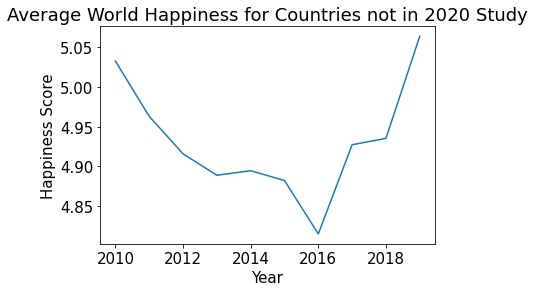

In [22]:
all_data_missing_2020.groupby(['year'])['Life Ladder'].mean().plot(figsize=(6,4))
plt.title("Average World Happiness for Countries not in 2020 Study")
plt.xlabel("Year")
plt.ylabel("Happiness Score");

In [23]:
all_data_with_2020['Life Ladder'].mean()

5.747850783952364

In [24]:
all_data_missing_2020['Life Ladder'].mean()

4.931214520311731

The countries missing 2020 data have historically been less happy than those with 2020 data.
This explains the drastic increase in overall world happiness from 2019 to 2020.

Showing only countries with 2020 data, we actually see a decrease in happiness from 2019 to 2020...
perhaps due to COVID, however happiness for both sets have been generally increasing in the last 5 years.

With so much missing data, cannot conclude overall world happiness for 2020...95 countries vs 164

In [26]:
all_data_missing_2020['Regional indicator'].value_counts()

### Most of the missing data is for Sub-Saharan Africa (39% of countries represented in 2020)
### Most of the 2020 data is from Europe (92% of countries represented in 2020)

# Is 2020 the only year missing so much data from Africa? How trustworthy is the rest of our data?
# Is it worth looking into?...

Sub-Saharan Africa                    170
Latin America and Caribbean            83
Middle East and North Africa           53
Commonwealth of Independent States     49
South Asia                             40
Southeast Asia                         37
Western Europe                         17
Central and Eastern Europe             10
Name: Regional indicator, dtype: int64

In [27]:
all_regions = final[['Country name','Regional indicator']].drop_duplicates()
regions_with_2020 = all_data_with_2020[['Country name','Regional indicator']].drop_duplicates()
regions_missing_2020 = all_data_missing_2020[['Country name','Regional indicator']].drop_duplicates()

In [28]:
all_regions['Regional indicator'].value_counts()

Sub-Saharan Africa                    36
Western Europe                        21
Latin America and Caribbean           20
Central and Eastern Europe            17
Middle East and North Africa          17
Commonwealth of Independent States    12
Southeast Asia                         9
South Asia                             7
East Asia                              6
North America and ANZ                  4
Name: Regional indicator, dtype: int64

In [29]:
regions_with_2020['Regional indicator'].value_counts()

Western Europe                        19
Central and Eastern Europe            16
Sub-Saharan Africa                    14
Latin America and Caribbean           11
Middle East and North Africa          11
Commonwealth of Independent States     7
East Asia                              6
Southeast Asia                         5
North America and ANZ                  4
South Asia                             2
Name: Regional indicator, dtype: int64

#### PLOT TIME SERIES FOR TOP/BOTTOM 10:

In [31]:
### Define functions to find top/bottom countries for given year 

def find_bottom_ten(YEAR):
    df = final[final['year']==YEAR].sort_values(by='Life Ladder',ascending=False)
    return df.iloc[-10:,0]

def find_top_ten(YEAR):
    df = final[final['year']==YEAR].sort_values(by='Life Ladder',ascending=False)
    return df.iloc[:10,0]

In [32]:
### Find countries that ranked in top 10 most often over the last 10 years (12 chosen because there were ties...)
top_countries = pd.Series(dtype='str')

for year in range(2010,2021):
    top_countries = top_countries.append(find_top_ten(year))
    
top10 = top_countries.value_counts().index[:12].tolist()

In [33]:
### Find countries that ranked in bottom 10 most often over the last 10 years (12 chosen because there were ties...)
bottom_countries = pd.Series(dtype='str')

for year in range(2010,2021):
    bottom_countries = bottom_countries.append(find_bottom_ten(year))

bottom10 = bottom_countries.value_counts().index[:12].tolist()

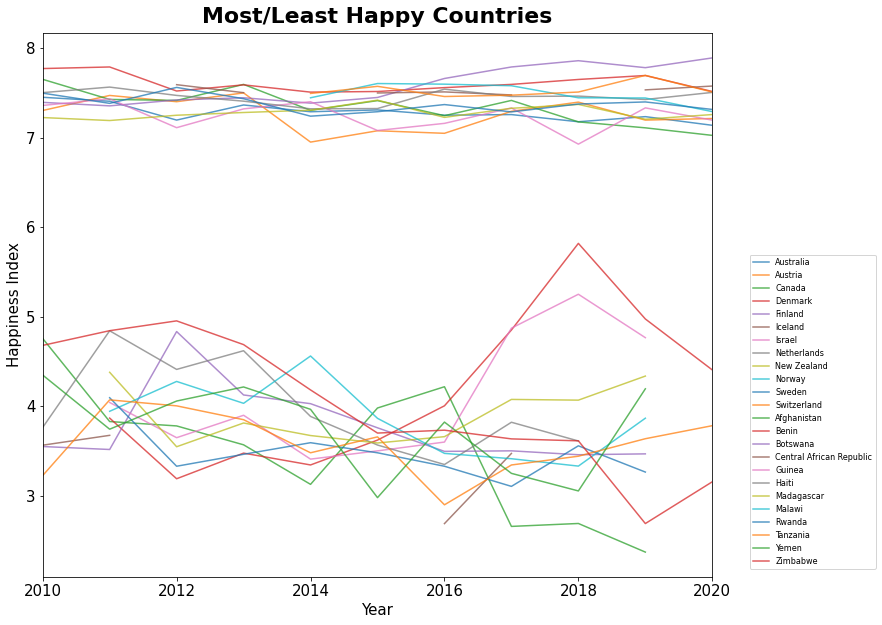

In [34]:
### Plot countries that occured in the top/bottom 10 most often over last 10 years ##
fig, ax = plt.subplots(figsize=(12,10))

plot_top_10 = final[final['Country name'].isin(top10)]
plot_top_10.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax,alpha=0.75)

plot_bottom_10 = final[final['Country name'].isin(bottom10)]
plot_bottom_10.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax,alpha=0.75)

plt.legend(bbox_to_anchor = (1.05, 0.6),fontsize=8)
plt.xlim([2010,2020])
plt.title("Most/Least Happy Countries",fontsize=22,fontweight="bold",pad=10)
plt.xlabel("Year",fontsize=15)
plt.ylabel("Happiness Index",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

### Note: There is more variability in scores in the less happy countries.
### Note: No countries are less than 2 or higher than 8...people are hesitant to committ to extremes, 
###       there is always room for better or worse...

# Visual improvement ideas: Create 2 seperate legends...(for all following plots) > Notes 07Visualizations

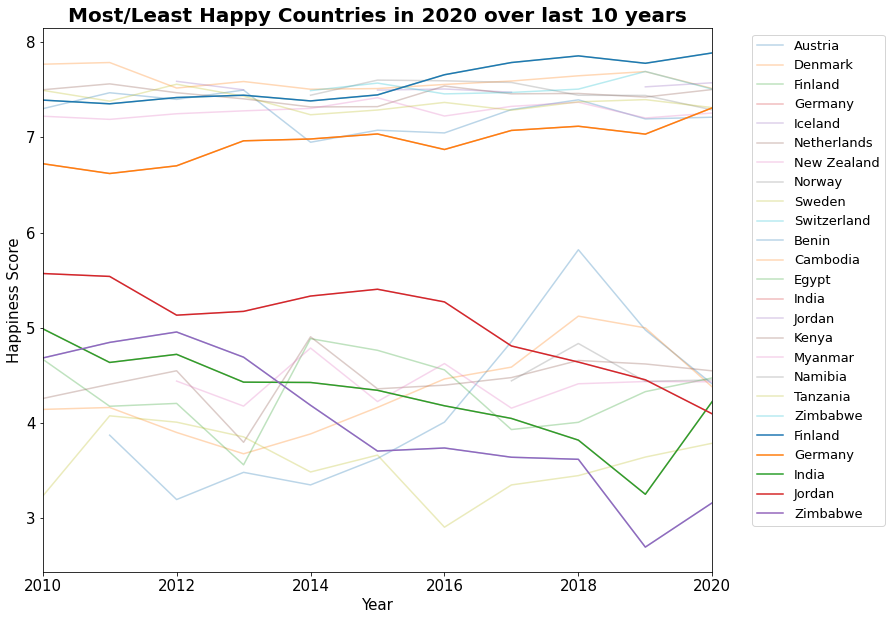

In [35]:
### Repeat for countries that are top/bottom 10 in 2020 ###

top2020 = final[final['year']==2020].sort_values(by='Life Ladder')['Country name'].tail(10).tolist()
bottom2020 = final[final['year']==2020].sort_values(by='Life Ladder')['Country name'].head(10).tolist()

fig, ax = plt.subplots(figsize=(12,10))

plot_top_2020 = final[final['Country name'].isin(top2020)]
plot_top_2020.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax,alpha=0.3)

plot_bottom_2020 = final[final['Country name'].isin(bottom2020)]
plot_bottom_2020.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax,alpha=0.3)

plt_highlight = final[final['Country name'].str.match("Germany|Finland|Zimbabwe|India|Jordan")]
plt_highlight.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax)

plt.legend(bbox_to_anchor = (1.05, 1),fontsize=13)
plt.xlim([2010,2020])
plt.title("Most/Least Happy Countries in 2020 over last 10 years",fontsize=20,fontweight="bold")
plt.xlabel("Year",fontsize=15)
plt.ylabel("Happiness Score",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

### Note: Again, more variability in less happy countries
### Note: Germany (and Finland) increased significantly over the past 10 years (especially considering how high score already is)

### Note: India (and Zimbabwe): decreasing since 2010 then jumps back up in 2020? Any ideas why?...


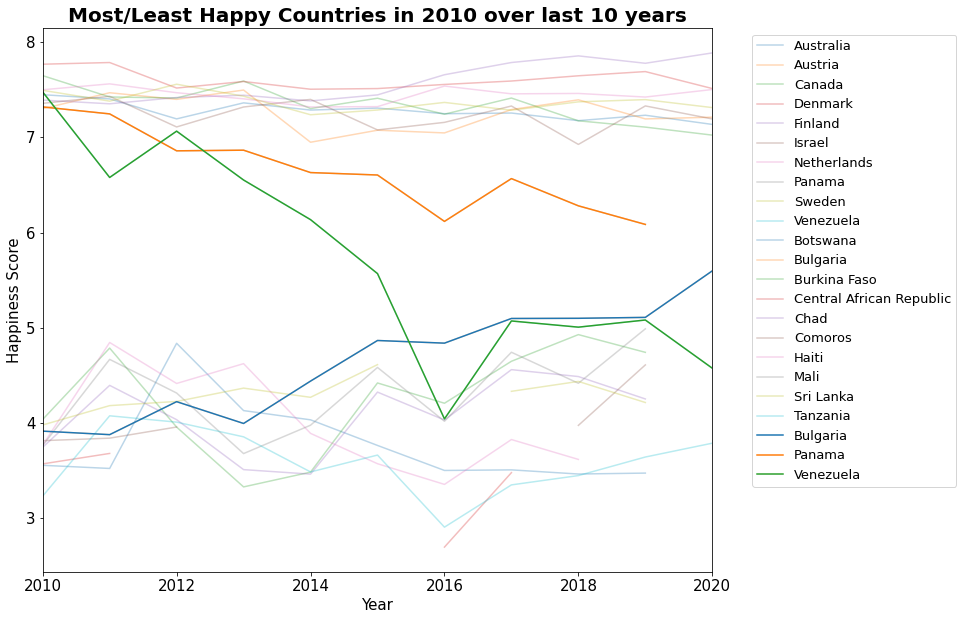

In [36]:
### Repeat above for countries in the top/bottom in 2010 
### (goal: see if any were in extreme but have changed significantly)

top2010 = final[final['year']==2010].sort_values(by='Life Ladder')['Country name'].tail(10).tolist()
bottom2010 = final[final['year']==2010].sort_values(by='Life Ladder')['Country name'].head(10).tolist()

fig, ax = plt.subplots(figsize=(12,10))

plot_top_2010 = final[final['Country name'].isin(top2010)]
plot_top_2010.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax,alpha=0.3)

plot_bottom_2010 = final[final['Country name'].isin(bottom2010)]
plot_bottom_2010.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax,alpha=0.3)

plt_highlight = final[final['Country name'].str.match("Venezuela|Panama|Bulgaria")]
plt_highlight.pivot(index='year', columns='Country name', values='Life Ladder').plot(ax=ax)

plt.legend(bbox_to_anchor = (1.05, 1),fontsize=13)
plt.xlim([2010,2020])
plt.title("Most/Least Happy Countries in 2010 over last 10 years",fontsize=20,fontweight="bold")
plt.xlabel("Year",fontsize=15)
plt.ylabel("Happiness Score",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

### Note: VENEZUELA (Drastic drop from one of the highest scores in 2010 to lowest in 2020!)
###       Panama also dropped significantly

###       Bulgaria increased significantly, even in 2020

### Note: Do not have 2020 data for a lot of the less happy countries...

In [37]:
#### Calculate change in score from 2010 to 2020. Identify countries with most change over time:

scores2020 = final[final['year']==2020][['Country name','Life Ladder']].rename(columns={'Life Ladder':'Score 2020'})
scores2010 = final[final['year']==2010][['Country name','Life Ladder']].rename(columns={'Life Ladder':'Score 2010'})

diff = pd.merge(pd.merge(final,scores2020),scores2010)
diff['Difference'] = diff['Score 2020']-diff['Score 2010']

diff = diff[diff['year']==2020].sort_values(by="Difference",ascending=False, key=abs)
diff.head(10)

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,...,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder,Score 2020,Score 2010,Difference
870,Venezuela,2020,4.573830,NaN,0.805224,66.900002,0.611815,NaN,0.811319,0.722391,...,0.0,Authoritarian Regime,2.76,6.423750,-66.589730,Latin America and Caribbean,5.741334,4.573830,7.478455,-2.904625
119,Bulgaria,2020,5.597723,9.990658,0.916242,67.199997,0.818225,-0.004322,0.900633,0.705835,...,0.0,Flawed Democracy,6.71,42.733883,25.485830,Central and Eastern Europe,4.640569,5.597723,3.912276,1.685447
661,Serbia,2020,6.041546,9.788260,0.852102,69.000000,0.843480,0.149401,0.824472,0.602846,...,1.0,Flawed Democracy,6.22,44.016521,21.005859,Central and Eastern Europe,5.368864,6.041546,4.461304,1.580242
881,Zimbabwe,2020,3.159802,7.828757,0.717243,56.799999,0.643303,-0.008696,0.788523,0.702573,...,0.0,Authoritarian Regime,3.16,-19.015438,29.154857,Sub-Saharan Africa,3.991241,3.159802,4.681570,-1.521767
433,Jordan,2020,4.093992,9.149995,0.708840,67.199997,0.778533,-0.149826,NaN,NaN,...,0.0,Authoritarian Regime,3.62,30.585164,36.238414,Middle East and North Africa,5.037789,4.093992,5.569942,-1.475951
532,Mongolia,2020,6.011365,9.395559,0.917789,62.700001,0.718491,0.141357,0.842828,0.636443,...,0.0,Flawed Democracy,6.48,46.862496,103.846656,East Asia,5.150189,6.011365,4.585524,1.425841
488,Lithuania,2020,6.391379,10.503607,0.952544,68.500000,0.824061,-0.121781,0.829205,0.660230,...,1.0,Flawed Democracy,7.13,55.169438,23.881275,Central and Eastern Europe,5.873176,6.391379,5.065825,1.325554
357,Hungary,2020,6.038050,10.335148,0.943400,68.400002,0.770968,-0.120405,0.836105,0.735238,...,0.0,Flawed Democracy,6.56,47.162494,19.503304,Central and Eastern Europe,5.386684,6.038050,4.725132,1.312917
272,El Salvador,2020,5.461927,9.018846,0.695624,66.699997,0.923945,-0.126474,0.583036,0.838904,...,0.0,Hybrid Regime,5.90,13.794185,-88.896530,Latin America and Caribbean,6.022977,5.461927,6.739911,-1.277984
477,Kyrgyzstan,2020,6.249586,8.503411,0.902223,64.699997,0.934885,0.102866,0.931318,0.803025,...,0.0,Hybrid Regime,4.21,41.204380,74.766098,Commonwealth of Independent States,5.309409,6.249586,4.996411,1.253175


#### ANALYZE FACTORS AFFECTING HAPPINESS:

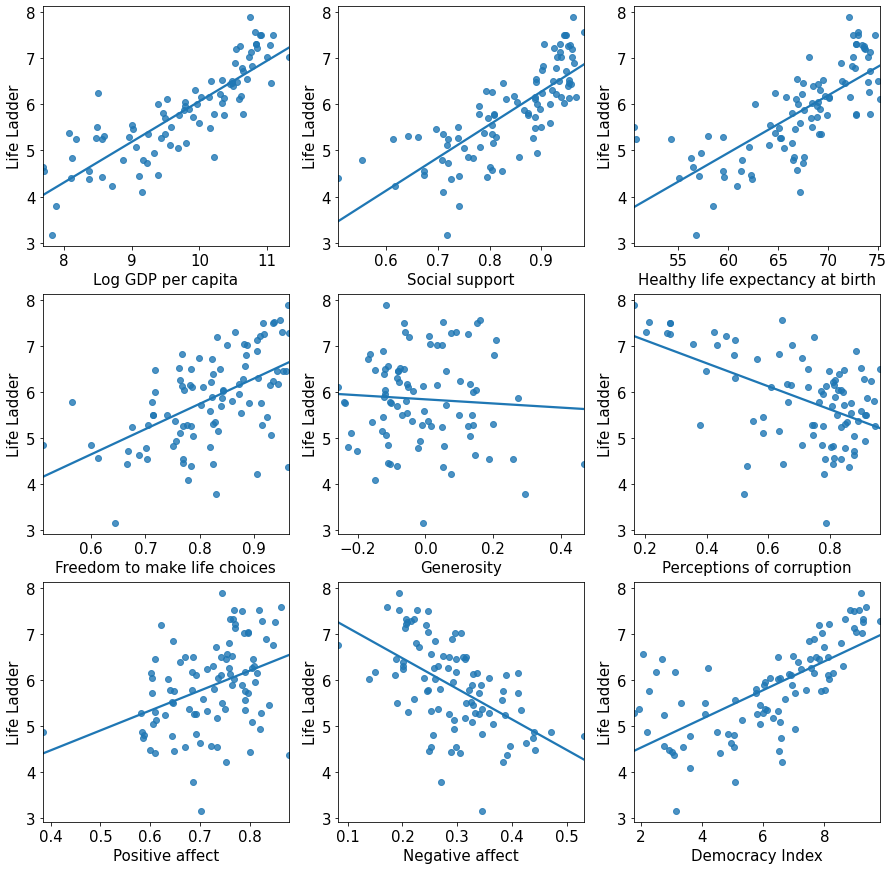

In [38]:
### Plot correlations for WHR factors against Ladder Scores ###

whd2020 = final[final['year']==2020]

plt.figure(figsize=(15,15))
i=1
for column in whd2020.iloc[:,3:11]:
    plt.subplot(3,3,i)
    sns.regplot(x=whd2020[column],y=whd2020['Life Ladder'],ci=False)
    i+=1

plt.subplot(3,3,9)
sns.regplot(x=whd2020['Democracy Index'],y=whd2020['Life Ladder'],ci=False);


### Strongest correlation with GDP
### Interesting that generosity shows no correlation with happiness

### NOTE: It is likely these factors are related to each other and therefore have similar effects on happiness...

In [39]:
### Investigate Positive Affect further:

### Outlier is Turkey 
### Also interesting is Cambodia- highest positive effect, but one of the lowest Ladder Score...

whd2020.sort_values(by="Positive affect")

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Median age,Island,Female head of government,Government Type,Democracy Index,latitude,longitude,Regional indicator,Avg Ladder
1369,Turkey,2020,4.861554,10.219084,0.856730,67.599998,0.510386,-0.110889,0.774417,0.384292,0.440387,31.600000,0.0,0.0,Hybrid Regime,4.48,38.963745,35.243322,Middle East and North Africa,5.264237
106,Bangladesh,2020,5.279987,8.472195,0.739338,65.300003,0.777467,-0.008851,0.741659,0.582381,0.331709,27.500000,0.0,1.0,Hybrid Regime,5.99,23.684994,90.356331,South Asia,4.750646
600,Iran,2020,4.864528,NaN,0.757219,66.599998,0.599594,NaN,0.709902,0.582421,0.470245,32.400002,0.0,0.0,Authoritarian Regime,2.20,32.427908,53.688046,Middle East and North Africa,4.746650
1358,Tunisia,2020,4.730811,9.230624,0.719013,67.500000,0.667758,-0.201814,0.877354,0.584634,0.438774,32.700001,0.0,0.0,Flawed Democracy,6.59,33.886917,9.537499,Middle East and North Africa,4.731324
914,Morocco,2020,4.802618,8.870917,0.552520,66.500000,0.818995,-0.228578,0.802740,0.587182,0.256431,29.600000,0.0,0.0,Hybrid Regime,5.04,31.791702,-7.092620,Middle East and North Africa,5.019815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,Taiwan Province of China,2020,6.751068,NaN,0.900833,NaN,0.798835,NaN,0.710567,0.845393,0.082737,42.200001,0.0,1.0,NaN,NaN,NaN,NaN,East Asia,6.404069
965,New Zealand,2020,7.257382,10.600457,0.951991,73.599998,0.918155,0.125260,0.282768,0.849415,0.208541,37.900002,1.0,1.0,Full Democracy,9.25,-40.900557,174.885971,North America and ANZ,7.277628
569,Iceland,2020,7.575490,10.824201,0.983286,73.000000,0.948627,0.160274,0.644064,0.863018,0.171795,37.299999,1.0,1.0,Full Democracy,9.37,64.963051,-19.020835,Western Europe,7.526338
219,Cambodia,2020,4.376985,8.361936,0.724423,62.400002,0.963075,0.052430,0.863054,0.877954,0.389852,25.600000,0.0,0.0,Authoritarian Regime,3.10,12.565679,104.990963,Southeast Asia,4.315014


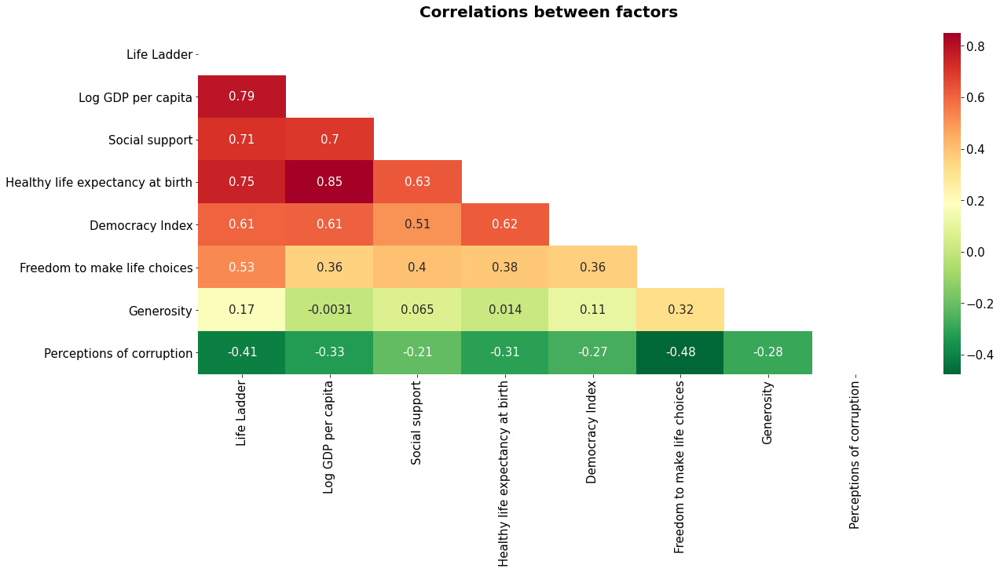

In [40]:
### Correlations Between Factors on Heatmap

cols = final[['Life Ladder', 'Log GDP per capita','Social support', 'Healthy life expectancy at birth',
       'Democracy Index','Freedom to make life choices', 'Generosity', 'Perceptions of corruption']]
plt.figure(figsize=(20, 8))
sns.heatmap(cols.corr(), annot = True, cmap='RdYlGn_r', mask=np.triu(np.ones_like(cols.corr())));
plt.title('Correlations between factors', fontsize=20, fontweight='bold', pad=20);

### The high correlation between logged GDP per capita and ladder score
### The high correlation between log GDP per capita and healthy life expectancy
### The high correlation between healthy life expectancy and social support
### Weak correlation between ladder score and generosity

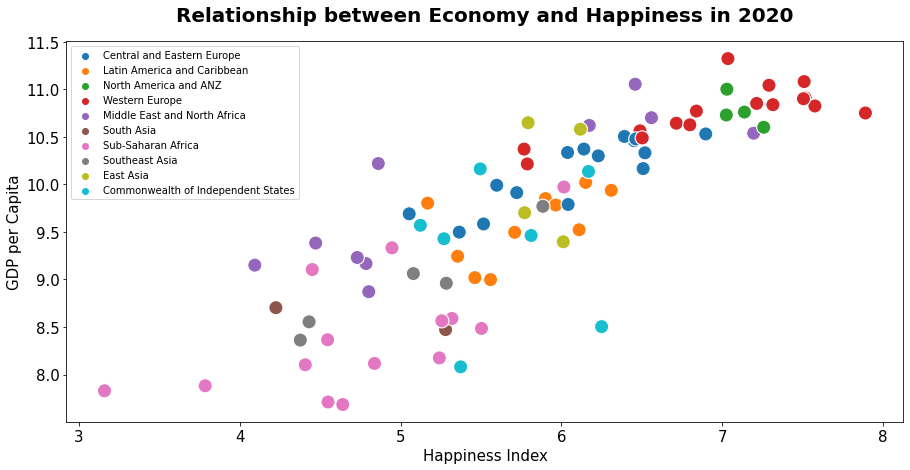

In [41]:
### Relationship between Economy and Happiness in 2020

plt.rcParams['figure.figsize'] =(15,7)
plt.title('Relationship between Economy and Happiness in 2020', fontsize=20, fontweight='bold', pad=20)
sns.scatterplot(x = final2020['Life Ladder'], y = final2020['Log GDP per capita'],
                hue = final2020['Regional indicator'], s=200)
plt.legend(loc = 'upper left', fontsize = '10')
plt.xlabel('Happiness Index')
plt.ylabel('GDP per Capita');

In [42]:
### Investigate effects of government type on happiness

STAT3 = final.groupby('Government Type',as_index=False)[['Life Ladder']].mean()
STAT3 = STAT3.sort_values(by='Life Ladder', ascending=False)
STAT3

,Government Type,Life Ladder
2,Full Democracy,6.993881
1,Flawed Democracy,5.728643
0,Authoritarian Regime,4.891591
3,Hybrid Regime,4.819115


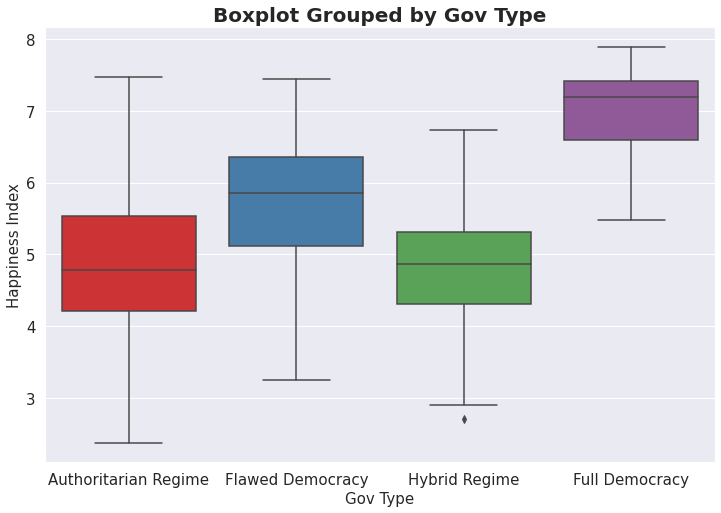

In [43]:
### Boxplot Grouped by Goverment Type
sns.set()
plt.figure(figsize=(12,8))

BOX = sns.boxplot(x='Government Type', y='Life Ladder', data=final, palette="Set1")
plt.title('Boxplot Grouped by Gov Type', fontsize=20, fontweight='bold')
plt.xlabel('Gov Type', fontsize=15)
plt.ylabel('Happiness Index', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

#### US / CHINA COMPARISON:

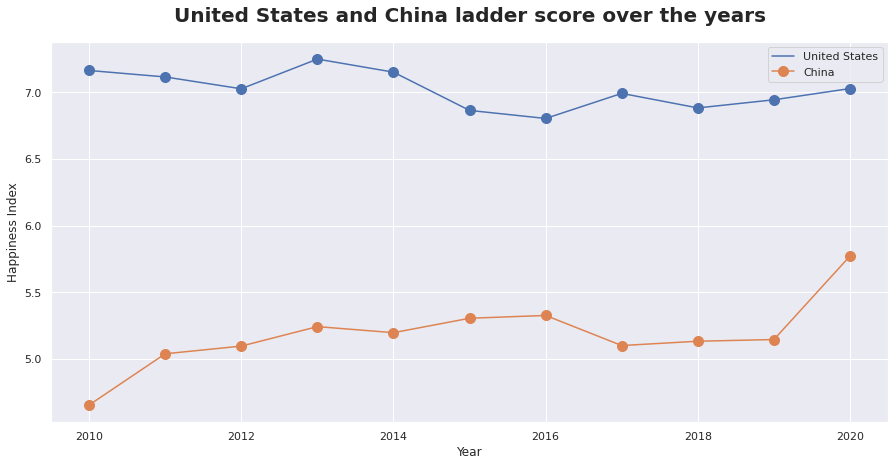

In [44]:
fig, ax = plt.subplots()
final[final["Country name"]=="United States"].plot.line('year', 'Life Ladder', ax=ax, label="United States", marker='o', markersize=10)
final[final["Country name"]=="China"].plot.line('year', 'Life Ladder', ax=ax, label="China",  marker='o', markersize=10)
plt.title('United States and China ladder score over the years', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Year')
plt.ylabel('Happiness Index')
plt.show()

### Note: Despite our statement in our proposal, the United States happiness rating is relatively stable.
###       China has increased over 1 pt in last 10 years.


#### INVESTIGATE HAPPINESS BASED ON GEOGRAPHY:

In [48]:
STAT = final[['Country name', 'Regional indicator', 'Life Ladder', 'Island']]

In [49]:
### Find avg happiness index for island vs. non-island (island=1)
STATIS = STAT.groupby("Island")[['Life Ladder']].agg(['mean','count'])
STATIS

Life Ladder      
              mean count
Island                  
0.0       5.414945  1321
1.0       5.904609   183

In [50]:
### Find avg happiness index by region
STAT2 = STAT.groupby('Regional indicator',as_index=False)[['Life Ladder']].mean()
STAT2 = STAT2.sort_values(by='Life Ladder', ascending=False)
STAT2

,Regional indicator,Life Ladder
5,North America and ANZ,7.229844
9,Western Europe,6.784563
3,Latin America and Caribbean,6.024052
2,East Asia,5.709332
0,Central and Eastern Europe,5.586994
4,Middle East and North Africa,5.352966
7,Southeast Asia,5.346375
1,Commonwealth of Independent States,5.268635
6,South Asia,4.483569
8,Sub-Saharan Africa,4.314707


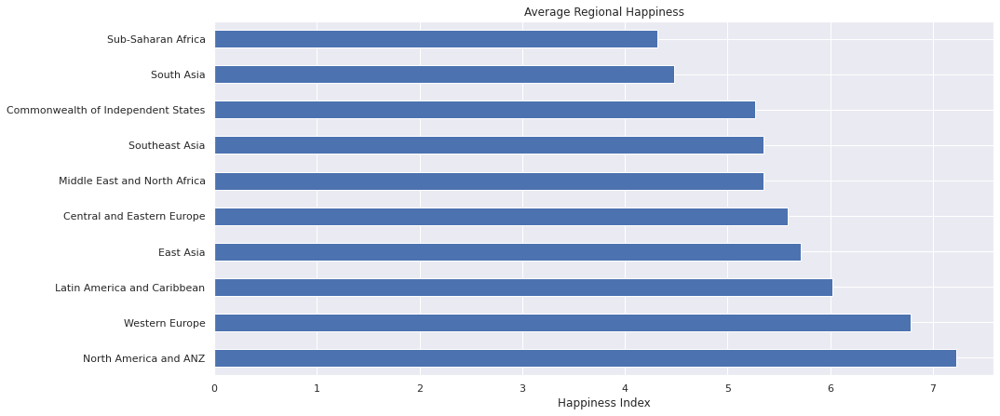

In [51]:
BC = STAT2.plot.barh(x='Regional indicator', y='Life Ladder', legend=False)
plt.xlabel('Happiness Index')
plt.ylabel('')
plt.title('Average Regional Happiness');

In [52]:
HAPI = final.groupby('Country name',as_index=False)

HAPI2 = HAPI[['Life Ladder', 'Country name', 'latitude', 'longitude']].mean()
HAPI2

,Country name,Life Ladder,latitude,longitude
0,Afghanistan,3.501017,33.939110,67.709953
1,Albania,5.012075,41.153332,20.168331
2,Algeria,5.389717,28.033886,1.659626
3,Angola,4.420299,-11.202692,17.873887
4,Argentina,6.352840,-38.416097,-63.616672
...,...,...,...,...
159,Venezuela,5.741334,6.423750,-66.589730
160,Vietnam,5.278218,14.058324,108.277199
161,Yemen,3.765910,15.552727,48.516388
162,Zambia,4.491208,-13.133897,27.849332


#### CREATE MAP VISUAL:

In [53]:
### READ in country geometry data
df = gpd.read_file('data/countries.geojson')
df

,ADMIN,ISO_A3,geometry
0,Aruba,ABW,"POLYGON ((-69.99694 12.57758, -69.93639 12.531..."
1,Afghanistan,AFG,"POLYGON ((71.04980 38.40866, 71.05714 38.40903..."
2,Angola,AGO,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -..."
3,Anguilla,AIA,"MULTIPOLYGON (((-63.03767 18.21296, -63.09952 ..."
4,Albania,ALB,"POLYGON ((19.74777 42.57890, 19.74601 42.57993..."
...,...,...,...
250,Samoa,WSM,"MULTIPOLYGON (((-171.57002 -13.93816, -171.564..."
251,Yemen,YEM,"MULTIPOLYGON (((53.30824 12.11839, 53.31027 12..."
252,South Africa,ZAF,"MULTIPOLYGON (((37.86378 -46.94085, 37.83644 -..."
253,Zambia,ZMB,"POLYGON ((31.11984 -8.61663, 31.14102 -8.60619..."


In [54]:
GEO = df[['ADMIN', 'geometry']].rename(columns={'ADMIN':'Country name'})
GEO

,Country name,geometry
0,Aruba,"POLYGON ((-69.99694 12.57758, -69.93639 12.531..."
1,Afghanistan,"POLYGON ((71.04980 38.40866, 71.05714 38.40903..."
2,Angola,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -..."
3,Anguilla,"MULTIPOLYGON (((-63.03767 18.21296, -63.09952 ..."
4,Albania,"POLYGON ((19.74777 42.57890, 19.74601 42.57993..."
...,...,...
250,Samoa,"MULTIPOLYGON (((-171.57002 -13.93816, -171.564..."
251,Yemen,"MULTIPOLYGON (((53.30824 12.11839, 53.31027 12..."
252,South Africa,"MULTIPOLYGON (((37.86378 -46.94085, 37.83644 -..."
253,Zambia,"POLYGON ((31.11984 -8.61663, 31.14102 -8.60619..."


In [55]:
### Clean data
GEO2 = GEO
GEO2.iloc[238] = GEO.iloc[238].replace(to_replace="United States of America", value="United States")

In [56]:
### Merge happiness data with geometry dataframe

mrg = pd.merge(GEO2[['Country name', 'geometry']], HAPI2, how='left')
mrg

,Country name,geometry,Life Ladder,latitude,longitude
0,Aruba,"POLYGON ((-69.99694 12.57758, -69.93639 12.531...",NaN,NaN,NaN
1,Afghanistan,"POLYGON ((71.04980 38.40866, 71.05714 38.40903...",3.501017,33.939110,67.709953
2,Angola,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -...",4.420299,-11.202692,17.873887
3,Anguilla,"MULTIPOLYGON (((-63.03767 18.21296, -63.09952 ...",NaN,NaN,NaN
4,Albania,"POLYGON ((19.74777 42.57890, 19.74601 42.57993...",5.012075,41.153332,20.168331
...,...,...,...,...,...
250,Samoa,"MULTIPOLYGON (((-171.57002 -13.93816, -171.564...",NaN,NaN,NaN
251,Yemen,"MULTIPOLYGON (((53.30824 12.11839, 53.31027 12...",3.765910,15.552727,48.516388
252,South Africa,"MULTIPOLYGON (((37.86378 -46.94085, 37.83644 -...",4.749302,-30.559482,22.937506
253,Zambia,"POLYGON ((31.11984 -8.61663, 31.14102 -8.60619...",4.491208,-13.133897,27.849332


In [57]:
%%opts Polygons [fig_inches=(200,200), colorbar=True]

polys = gv.Polygons(data=mrg,vdims=['Life Ladder', 'Country name'])

polys.opts(title="World Perception of Happiness", width=800,height=600, tools=['hover'], cmap='Greens')

polys * gv.tile_sources.ESRI()

:Overlay
   .Polygons.I :Polygons   [Longitude,Latitude]   (Life Ladder,Country name)
   .WMTS.I     :WMTS   [Longitude,Latitude]